In [ ]:
!ls "/content/drive/My Drive"


'Ayesha Amjad CV.pdf'  'Colab Notebooks'   PD.zip		       vcDatasetFinal
 code_corpus.txt        Kaggle		   python_bpe_tokenizer.json


In [ ]:
import os

# Create the .kaggle directory if it doesn't exist
os.makedirs("/root/.kaggle", exist_ok=True)

# Copy kaggle.json from Google Drive
!cp "/content/drive/MyDrive/Kaggle/Kaggle/kaggle.json" "/root/.kaggle/"

# Set correct permissions
!chmod 600 /root/.kaggle/kaggle.json

# Verify Kaggle API is working
!kaggle datasets list


ref                                                                    title                                                size  lastUpdated          downloadCount  voteCount  usabilityRating  
---------------------------------------------------------------------  --------------------------------------------------  -----  -------------------  -------------  ---------  ---------------  
atharvasoundankar/chocolate-sales                                      Chocolate Sales Data 📊🍫                              63KB  2025-03-07 05:44:03           4938         66  1.0              
abdulmalik1518/mobiles-dataset-2025                                    Mobiles Dataset (2025)                               20KB  2025-02-18 06:50:24          11885        209  1.0              
salahuddinahmedshuvo/ecommerce-consumer-behavior-analysis-data         Ecommerce Consumer Behavior Analysis Data            43KB  2025-03-03 13:09:09           2597         43  0.9411765        
willianoliveiragibin/pixa

Downloading the dataset

In [ ]:
!kaggle datasets download -d splcher/animefacedataset -p /content/drive/MyDrive/Kaggle/Datasets


Dataset URL: https://www.kaggle.com/datasets/splcher/animefacedataset
License(s): DbCL-1.0
100% 393M/395M [00:04<00:00, 69.2MB/s]
100% 395M/395M [00:04<00:00, 89.1MB/s]


In [ ]:
dataset_path = "/content/drive/MyDrive/Kaggle/Datasets"
print("Files in dataset folder:", os.listdir(dataset_path))


Files in dataset folder: ['animefacedataset.zip', 'animefacedataset']


In [ ]:
import zipfile
import os

zip_path = "/content/drive/MyDrive/Kaggle/Datasets/animefacedataset.zip"
extract_path = "/content/drive/MyDrive/Kaggle/Datasets/animefacedataset"

os.makedirs(extract_path, exist_ok=True)

with zipfile.ZipFile(zip_path, 'r') as zip_ref:
    zip_ref.extractall(extract_path)

print("Extraction complete!")


Extraction complete!


loading dataset

Image size (Width x Height): 62 x 62


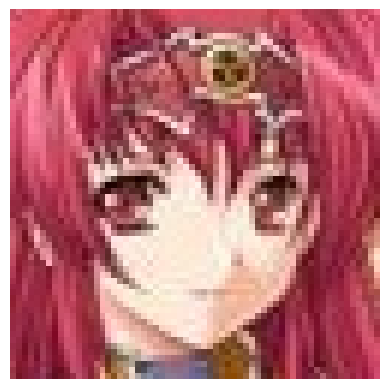

In [1]:
import cv2
import os
import matplotlib.pyplot as plt

# image_path = "/content/drive/MyDrive/Kaggle/Datasets/animefacedataset/images"
image_path = "/home/osama/Downloads/genai/archive/images"
image_files = [f for f in os.listdir(image_path) if f.endswith(('.png', '.jpg', '.jpeg'))]

if image_files:
    img = cv2.imread(os.path.join(image_path, image_files[99]))  # Read image

    if img is not None:
        height, width, channels = img.shape  # Get proper size
        print(f"Image size (Width x Height): {width} x {height}")

        plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
        plt.axis("off")
        plt.show()
    else:
        print("Error: Image cannot be loaded.")
else:
    print("No images found!")


Preprocessing

In [2]:
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision.transforms as transforms
import torchvision.datasets as datasets
from torch.utils.data import DataLoader
import matplotlib.pyplot as plt
import numpy as np
#%matplotlib inline
import argparse
import os
import random
import torch
import torch.nn as nn
import torch.nn.parallel
import torch.optim as optim
import torch.utils.data
import torchvision.datasets as dset
import torchvision.transforms as transforms
import torchvision.utils as vutils
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import HTML

# Set random seed for reproducibility
manualSeed = 999
#manualSeed = random.randint(1, 10000) # use if you want new results
print("Random Seed: ", manualSeed)
random.seed(manualSeed)
torch.manual_seed(manualSeed)
torch.use_deterministic_algorithms(True) # Needed for reproducible results

Random Seed:  999


In [ ]:
# Root directory for dataset
dataroot = "/home/osama/Downloads/genai/archive"

# Number of workers for dataloader
workers = 8

# Batch size during training
batch_size = 16

# Spatial size of training images. All images will be resized to this
#   size using a transformer.
image_size = 64

# Number of channels in the training images. For color images this is 3
nc = 3

# Size of z latent vector (i.e. size of generator input)
nz = 100

# Size of feature maps in generator
ngf = 64

# Size of feature maps in discriminator
ndf = 64

# Number of training epochs
num_epochs = 100

# Learning rate for optimizers
lr = 0.0002

# Beta1 hyperparameter for Adam optimizers
beta1 = 0.5

# Number of GPUs available. Use 0 for CPU mode.
ngpu = 1

device = 'cuda:0'

In [4]:
# We can use an image folder dataset the way we have it setup.
# Create the dataset
dataset = dset.ImageFolder(root=dataroot,
                           transform=transforms.Compose([
                               transforms.Resize(image_size),
                               transforms.CenterCrop(image_size),
                               transforms.ToTensor(),
                               transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)),
                           ]))
# Create the dataloader
dataloader = torch.utils.data.DataLoader(dataset, batch_size=batch_size,
                                         shuffle=True, num_workers=workers, pin_memory=True)


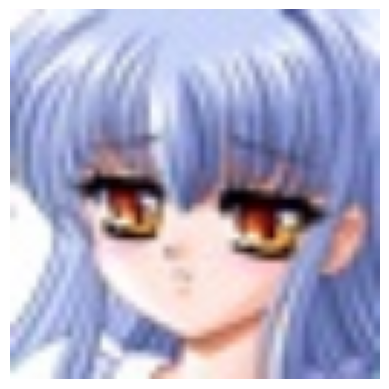

In [5]:
import matplotlib.pyplot as plt
import numpy as np

# Get a batch of images
dataiter = iter(dataloader)
images, _ = next(dataiter)  # Get first batch

# Function to unnormalize and convert tensor to numpy for visualization
def imshow(img):
    img = img * 0.5 + 0.5  # Unnormalize (since we normalized to (-1,1))
    npimg = img.numpy()
    plt.imshow(np.transpose(npimg, (1, 2, 0)))  # Convert from (C, H, W) to (H, W, C)
    plt.axis('off')
    plt.show()

# Show first image from the batch
imshow(images[0].cpu())


In [6]:
# Check min/max pixel values in the transformed image
print(f"Min pixel value: {images[0].min().item()}")
print(f"Max pixel value: {images[0].max().item()}")


Min pixel value: -1.0
Max pixel value: 1.0


Using device: cuda:0


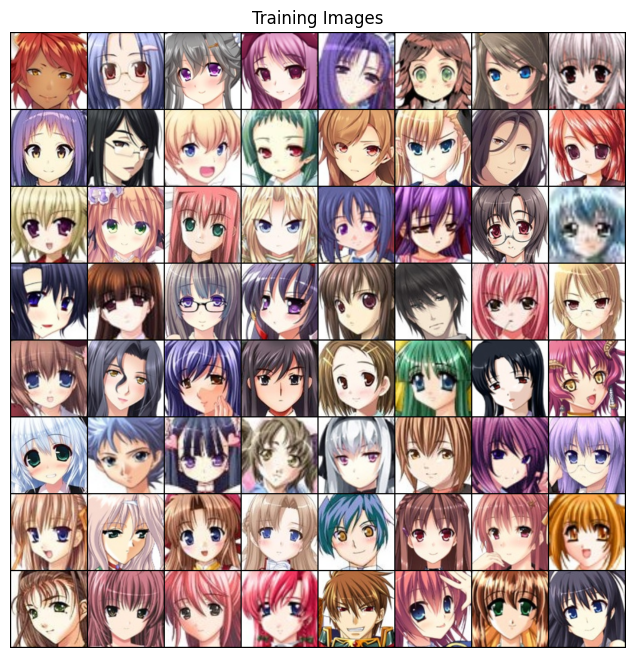

In [8]:
device = torch.device("cuda:0" if (torch.cuda.is_available() and ngpu > 0) else "cpu")
print(f"Using device: {device}")

# Load a batch of real images
real_batch = next(iter(dataloader))

# Move images to the correct device
real_images = real_batch[0].to(device)

# Plot images
plt.figure(figsize=(8,8))
plt.axis("off")
plt.title("Training Images")
plt.imshow(np.transpose(vutils.make_grid(real_images[:64], padding=2, normalize=True).cpu(), (1,2,0)))
plt.show()

In [9]:
import torch
print("GPU Available:", torch.cuda.is_available())
print("Device Name:", torch.cuda.get_device_name(0) if torch.cuda.is_available() else "CPU")


GPU Available: True
Device Name: NVIDIA GeForce GTX 1650


In [10]:
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0)

In [38]:
# Generator Code

class Generator(nn.Module):
    def __init__(self, ngpu):
        super(Generator, self).__init__()
        self.ngpu = ngpu
        self.main = nn.Sequential(
            # input is Z, going into a convolution
            nn.ConvTranspose2d( nz, ngf * 8, 4, 1, 0, bias=False),
            nn.BatchNorm2d(ngf * 8),
            nn.ReLU(True),
            # state size. ``(ngf*8) x 4 x 4``
            nn.ConvTranspose2d(ngf * 8, ngf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 4),
            nn.ReLU(True),
            # state size. ``(ngf*4) x 8 x 8``
            nn.ConvTranspose2d( ngf * 4, ngf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 2),
            nn.ReLU(True),
            # state size. ``(ngf*2) x 16 x 16``
            nn.ConvTranspose2d( ngf * 2, ngf, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf),
            nn.ReLU(True),
            # state size. ``(ngf) x 32 x 32``
            nn.ConvTranspose2d( ngf, nc, 4, 2, 1, bias=False),
            nn.Tanh()
            # state size. ``(nc) x 64 x 64``
        )

    def forward(self, input):
        return self.main(input)

In [39]:
# Create the generator
netG = Generator(ngpu).to(device)

# Handle multi-GPU if desired
if (device.type == 'cuda') and (ngpu > 1):
    netG = nn.DataParallel(netG, list(range(ngpu)))

# Apply the ``weights_init`` function to randomly initialize all weights
#  to ``mean=0``, ``stdev=0.02``.
netG.apply(weights_init)

# Print the model
print(netG)

Generator(
  (main): Sequential(
    (0): ConvTranspose2d(100, 512, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (4): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
    (6): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (7): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): ReLU(inplace=True)
    (9): ConvTranspose2d(128, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (10): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (11): ReLU(inplace=True)
    (12): ConvTranspose2d(64, 3, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (13): Tanh()
  )
)


In [40]:
class Discriminator(nn.Module):
    def __init__(self, ngpu):
        super(Discriminator, self).__init__()
        self.ngpu = ngpu
        self.main = nn.Sequential(
            # input is ``(nc) x 64 x 64``
            nn.Conv2d(nc, ndf, 4, 2, 1, bias=False),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. ``(ndf) x 32 x 32``
            nn.Conv2d(ndf, ndf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 2),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. ``(ndf*2) x 16 x 16``
            nn.Conv2d(ndf * 2, ndf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 4),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. ``(ndf*4) x 8 x 8``
            nn.Conv2d(ndf * 4, ndf * 8, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 8),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. ``(ndf*8) x 4 x 4``
            nn.Conv2d(ndf * 8, 1, 4, 1, 0, bias=False),
            nn.Sigmoid()
        )

    def forward(self, input):
        return self.main(input)

In [41]:
# Create the Discriminator
netD = Discriminator(ngpu).to(device)

# Handle multi-GPU if desired
if (device.type == 'cuda') and (ngpu > 1):
    netD = nn.DataParallel(netD, list(range(ngpu)))

# Apply the ``weights_init`` function to randomly initialize all weights
# like this: ``to mean=0, stdev=0.2``.
netD.apply(weights_init)

# Print the model
print(netD)

Discriminator(
  (main): Sequential(
    (0): Conv2d(3, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): LeakyReLU(negative_slope=0.2, inplace=True)
    (2): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (3): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (4): LeakyReLU(negative_slope=0.2, inplace=True)
    (5): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (6): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (7): LeakyReLU(negative_slope=0.2, inplace=True)
    (8): Conv2d(256, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (9): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (10): LeakyReLU(negative_slope=0.2, inplace=True)
    (11): Conv2d(512, 1, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (12): Sigmoid()
  )
)


In [42]:
# Initialize the ``BCELoss`` function
criterion = nn.BCELoss()

# Create batch of latent vectors that we will use to visualize
#  the progression of the generator
fixed_noise = torch.randn(64, nz, 1, 1, device=device)

# Establish convention for real and fake labels during training
real_label = 1.
fake_label = 0.

# Setup Adam optimizers for both G and D
optimizerD = optim.Adam(netD.parameters(), lr=lr, betas=(beta1, 0.999))
optimizerG = optim.Adam(netG.parameters(), lr=lr, betas=(beta1, 0.999))

In [ ]:
# Training Loop

# Lists to keep track of progress
img_list = []
G_losses = []
D_losses = []
iters = 0
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
netG.to(device)
netD.to(device)

print("Starting Training Loop...")
# For each epoch
for epoch in range(num_epochs):
    # For each batch in the dataloader
    for i, data in enumerate(dataloader, 0):

        ############################
        # (1) Update D network: maximize log(D(x)) + log(1 - D(G(z)))
        ###########################
        ## Train with all-real batch
        netD.zero_grad()
        # Format batch
        real_cpu = data[0].to(device)
        b_size = real_cpu.size(0)
        label = torch.full((b_size,), real_label, dtype=torch.float, device=device)
        # Forward pass real batch through D
        output = netD(real_cpu).view(-1)
        # Calculate loss on all-real batch
        # import pdb; pdb.set_trace()
        errD_real = criterion(output, label)
        # Calculate gradients for D in backward pass
        errD_real.backward()
        D_x = output.mean().item()

        ## Train with all-fake batch
        # Generate batch of latent vectors
        noise = torch.randn(b_size, nz, 1, 1, device=device)
        # Generate fake image batch with G
        fake = netG(noise)
        label.fill_(fake_label)
        # Classify all fake batch with D
        output = netD(fake.detach()).view(-1)
        # Calculate D's loss on the all-fake batch
        errD_fake = criterion(output, label)
        # Calculate the gradients for this batch, accumulated (summed) with previous gradients
        errD_fake.backward()
        D_G_z1 = output.mean().item()
        # Compute error of D as sum over the fake and the real batches
        errD = errD_real + errD_fake
        # Update D
        optimizerD.step()

        ############################
        # (2) Update G network: maximize log(D(G(z)))
        ###########################
        netG.zero_grad()
        label.fill_(real_label)  # fake labels are real for generator cost
        # Since we just updated D, perform another forward pass of all-fake batch through D
        output = netD(fake).view(-1)
        # Calculate G's loss based on this output
        errG = criterion(output, label)
        # Calculate gradients for G
        errG.backward()
        D_G_z2 = output.mean().item()
        # Update G
        optimizerG.step()

        # Output training stats
        if i % 50 == 0:
            print('[%d/%d][%d/%d]\tLoss_D: %.4f\tLoss_G: %.4f\tD(x): %.4f\tD(G(z)): %.4f / %.4f'
                  % (epoch, num_epochs, i, len(dataloader),
                     errD.item(), errG.item(), D_x, D_G_z1, D_G_z2))
            
    # Save model checkpoints every 20 epochs
    if epoch % 10 == 0:
        torch.save(netG.state_dict(), f"generator_epoch_{epoch}.pth")
        torch.save(netD.state_dict(), f"discriminator_epoch_{epoch}.pth")
        print(f"Saved model at epoch {epoch}")

        # Save Losses for plotting later
        G_losses.append(errG.item())
        D_losses.append(errD.item())

        # Check how the generator is doing by saving G's output on fixed_noise
        if (iters % 500 == 0) or ((epoch == num_epochs-1) and (i == len(dataloader)-1)):
            with torch.no_grad():
                fake = netG(fixed_noise).detach().cpu()
            img_list.append(vutils.make_grid(fake, padding=2, normalize=True))

        iters += 1

Training was done using a .py file for easier debugging since my GPU had memory constraints. I forgot to save the terminal logs, but I saved the model at each epoch and have the generated images from different epochs below.

Testing:

In [54]:
import torch

checkpoint = torch.load("generator_epoch_90.pth", map_location="cpu")
print("Checkpoint model keys and shapes:")
for key, value in checkpoint.items():
    print(f"{key}: {value.shape}")


Checkpoint model keys and shapes:
module.main.0.weight: torch.Size([100, 512, 4, 4])
module.main.1.weight: torch.Size([512])
module.main.1.bias: torch.Size([512])
module.main.1.running_mean: torch.Size([512])
module.main.1.running_var: torch.Size([512])
module.main.1.num_batches_tracked: torch.Size([])
module.main.3.weight: torch.Size([512, 256, 4, 4])
module.main.4.weight: torch.Size([256])
module.main.4.bias: torch.Size([256])
module.main.4.running_mean: torch.Size([256])
module.main.4.running_var: torch.Size([256])
module.main.4.num_batches_tracked: torch.Size([])
module.main.6.weight: torch.Size([256, 128, 4, 4])
module.main.7.weight: torch.Size([128])
module.main.7.bias: torch.Size([128])
module.main.7.running_mean: torch.Size([128])
module.main.7.running_var: torch.Size([128])
module.main.7.num_batches_tracked: torch.Size([])
module.main.9.weight: torch.Size([128, 64, 4, 4])
module.main.10.weight: torch.Size([64])
module.main.10.bias: torch.Size([64])
module.main.10.running_mean:

/tmp/ipykernel_11261/1244736693.py:3: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  checkpoint = torch.load("generator_epoch_90.pth", map_location="cpu")


/tmp/ipykernel_11261/1781794912.py:36: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  checkpoint = torch.load("generator_epoch_90.pth", map_location=device)


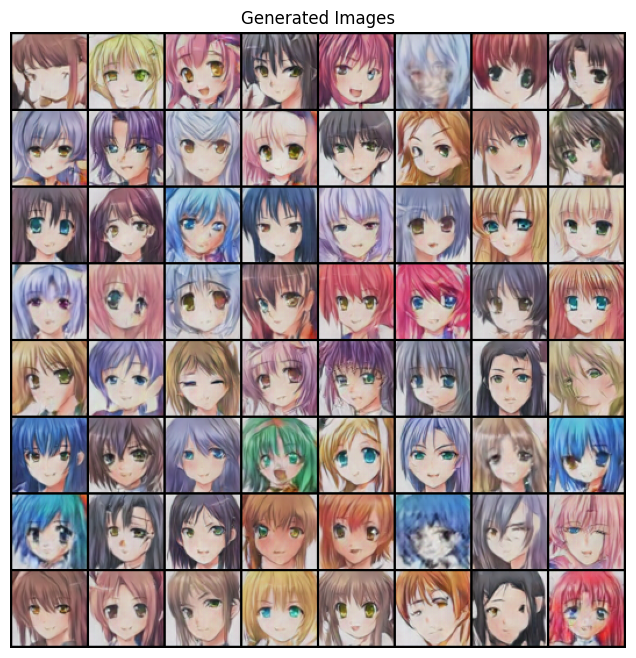

In [70]:
import torch
from collections import OrderedDict
import torchvision.utils as vutils
import matplotlib.pyplot as plt

# Define the generator model (ensure this matches your trained model architecture)
class Generator(torch.nn.Module):
    def __init__(self, ngpu):
        super(Generator, self).__init__()
        self.ngpu = ngpu
        self.main = torch.nn.Sequential(
            torch.nn.ConvTranspose2d(100, 512, 4, 1, 0, bias=False),
            torch.nn.BatchNorm2d(512),
            torch.nn.ReLU(True),
            torch.nn.ConvTranspose2d(512, 256, 4, 2, 1, bias=False),
            torch.nn.BatchNorm2d(256),
            torch.nn.ReLU(True),
            torch.nn.ConvTranspose2d(256, 128, 4, 2, 1, bias=False),
            torch.nn.BatchNorm2d(128),
            torch.nn.ReLU(True),
            torch.nn.ConvTranspose2d(128, 64, 4, 2, 1, bias=False),
            torch.nn.BatchNorm2d(64),
            torch.nn.ReLU(True),
            torch.nn.ConvTranspose2d(64, 3, 4, 2, 1, bias=False),
            torch.nn.Tanh()
        )

    def forward(self, input):
        return self.main(input)

# Load trained generator
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
netG = Generator(ngpu=1).to(device)

# Load checkpoint
checkpoint = torch.load("generator_epoch_90.pth", map_location=device)

# Remove 'module.' prefix if trained with DataParallel
new_state_dict = OrderedDict()
for k, v in checkpoint.items():
    new_key = k.replace("module.", "")  # Remove 'module.' prefix
    new_state_dict[new_key] = v

# Load state dict
netG.load_state_dict(new_state_dict, strict=False)  # strict=False to allow shape mismatches
netG.eval()  # Set to evaluation mode

# Generate random noise
fixed_noise = torch.randn(64, 100, 1, 1, device=device)  # Batch of 64 latent vectors

# Generate images
with torch.no_grad():
    fake_images = netG(fixed_noise).detach().cpu()

# Visualize generated images
plt.figure(figsize=(8, 8))
plt.axis("off")
plt.title("Generated Images")
plt.imshow(
    vutils.make_grid(fake_images[:64], padding=2, normalize=True).permute(1, 2, 0)
)
plt.show()


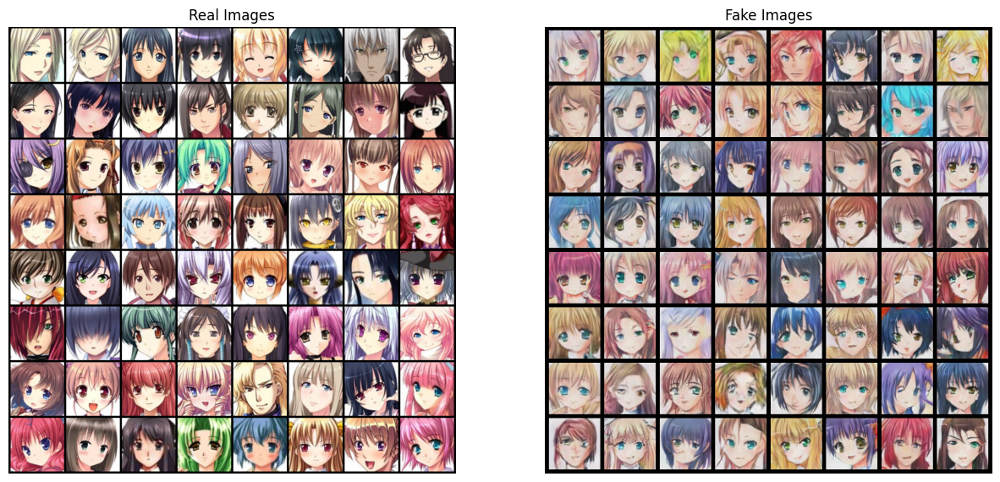

In [ ]:
# Grab a batch of real images from the dataloader
real_batch = next(iter(dataloader))

# Generate fake images from the last saved checkpoint
with torch.no_grad():
    fake_images = netG(fixed_noise).detach().cpu()

# Plot real and fake images side by side
fig, axs = plt.subplots(1, 2, figsize=(15, 15))

# Real images
axs[0].imshow(
    np.transpose(vutils.make_grid(real_batch[0].to(device)[:64], padding=5, normalize=True).cpu(), (1, 2, 0))
)
axs[0].axis("off")
axs[0].set_title("Real Images")

# Fake images
axs[1].imshow(
    np.transpose(vutils.make_grid(fake_images[:64], padding=5, normalize=True), (1, 2, 0))
)
axs[1].axis("off")
axs[1].set_title("Fake Images")

plt.show()

Loading generator_epoch_0.pth...
Loading generator_epoch_10.pth...
Loading generator_epoch_20.pth...


/tmp/ipykernel_11261/168396559.py:52: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  checkpoint = torch.load(model_path, map_location=device)


Loading generator_epoch_30.pth...
Loading generator_epoch_40.pth...
Loading generator_epoch_50.pth...
Loading generator_epoch_60.pth...
Loading generator_epoch_70.pth...
Loading generator_epoch_80.pth...
Loading generator_epoch_90.pth...


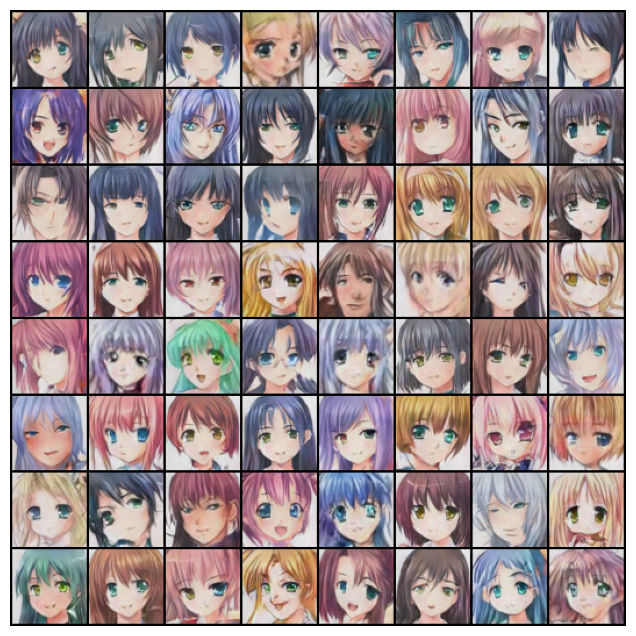

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import HTML
from collections import OrderedDict
import glob  # To fetch model files
# Set device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Create a fixed noise vector (same for all epochs)
fixed_noise = torch.randn(64, 100, 1, 1, device=device)

# Get sorted list of generator checkpoint files
model_paths = sorted(glob.glob("generator_epoch_*.pth"))  # Ensure correct order

# List to store generated images for animation
img_list = []

# Load generator models and generate images
for model_path in model_paths:
    print(f"Loading {model_path}...")

    netG = Generator(ngpu=1).to(device)  # Assuming Generator is already defined
    checkpoint = torch.load(model_path, map_location=device)

    # Clean checkpoint keys if needed
    new_state_dict = {k.replace("module.", ""): v for k, v in checkpoint.items()}

    netG.load_state_dict(new_state_dict, strict=False)
    netG.eval()  # Set to evaluation mode

    # Generate images
    with torch.no_grad():
        fake_images = netG(fixed_noise).cpu()

    # Convert to grid format and store
    img_list.append(vutils.make_grid(fake_images, padding=2, normalize=True))

# Create Animation
fig = plt.figure(figsize=(8, 8))
plt.axis("off")

# Convert tensors to numpy arrays for visualization
ims = [[plt.imshow(np.transpose(img.numpy(), (1, 2, 0)), animated=True)] for img in img_list]

# Create and display animation
ani = animation.ArtistAnimation(fig, ims, interval=1000, repeat_delay=1000, blit=True)
HTML(ani.to_jshtml())